In [1]:
# !pip install pycountry_convert
# !pip install pandas-profiling
# !pip install pydot
# !pip install scikit-optimize
# !pip install lightgbm

You should consider upgrading via the '/home/ray080186/.pyenv/versions/3.9.0/bin/python3.9 -m pip install --upgrade pip' command.
You should consider upgrading via the '/home/ray080186/.pyenv/versions/3.9.0/bin/python3.9 -m pip install --upgrade pip' command.
You should consider upgrading via the '/home/ray080186/.pyenv/versions/3.9.0/bin/python3.9 -m pip install --upgrade pip' command.
You should consider upgrading via the '/home/ray080186/.pyenv/versions/3.9.0/bin/python3.9 -m pip install --upgrade pip' command.
You should consider upgrading via the '/home/ray080186/.pyenv/versions/3.9.0/bin/python3.9 -m pip install --upgrade pip' command.


In [4]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
from pandas_profiling import ProfileReport
import pycountry_convert as pc
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.feature_selection import SelectKBest, mutual_info_regression, f_regression
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.model_selection import cross_validate, GridSearchCV, train_test_split
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.neural_network import MLPRegressor
from statsmodels.regression.linear_model import OLS
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import export_graphviz
import itertools
import pydot
from statsmodels.api import add_constant
from IPython.display import Image
from skopt import BayesSearchCV
import lightgbm as lgb

### Question 1.1
Plot a heatmap of the Pearson correlation matrix of the dataset columns. Report which features have the highest absolute correlation with the target variable. In the context of either dataset, describe what the correlation patterns suggest.
> Ans: Pearson correlation values range from -1 to +1. The absolute value indicates how strongly the two variables relate to each other, while the sign reveals whether they are positively or negatively related. From the heatmap, we see that features 'x', 'y', 'z' and 'carat' have the highest absolute correlation values with the target variable 'price'. Hence, we can conclude that 'x', 'y', 'z', and 'carat' are the most informative information if we want to predict the diamond price. 

In [5]:
diamonds_original = pd.read_csv('diamonds.csv')
diamonds_original = diamonds_original.drop(columns=['Unnamed: 0'])

In [6]:
cut_numeric = {'Fair': 1, 'Good': 2, 'Very Good': 3, 'Premium': 4, 'Ideal': 5}
color_numeric = {'J': 1, 'I': 2, 'H': 3, 'G': 4, 'F': 5, 'E': 6, 'D': 7}
clarity_numeric = {'I1': 1, 'SI2': 2, 'SI1': 3, 'VS2': 4, 'VS1': 5, 'VVS2': 6, 'VVS1': 7, 'IF': 8}
diamonds_original['cut_numeric'] = diamonds_original.cut.map(cut_numeric)
diamonds_original['color_numeric'] = diamonds_original.color.map(color_numeric)
diamonds_original['clarity_numeric'] = diamonds_original.clarity.map(clarity_numeric)

In [7]:
diamonds_original.head()

,carat,cut,color,clarity,depth,table,price,x,y,z,cut_numeric,color_numeric,clarity_numeric
0,0.23,Ideal,E,SI2,61.5,55.0,330,3.95,3.98,2.43,5,6,2
1,0.21,Premium,E,SI1,59.8,61.0,327,3.89,3.84,2.31,4,6,3
2,0.23,Good,E,VS1,56.9,65.0,328,4.05,4.07,2.31,2,6,5
3,0.29,Premium,I,VS2,62.4,58.0,337,4.20,4.23,2.63,4,2,4
4,0.31,Good,J,SI2,63.3,58.0,338,4.34,4.35,2.75,2,1,2


<AxesSubplot: >

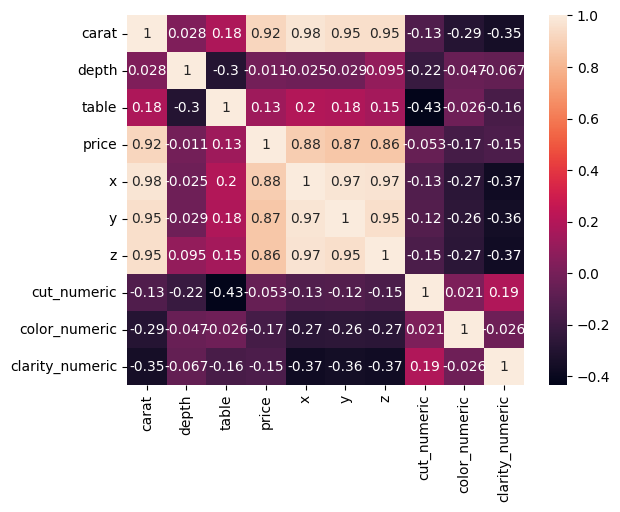

In [8]:
diamonds_data = diamonds_original.copy()
diamonds_data = diamonds_data.drop(columns=['cut', 'color', 'clarity'])
corr = diamonds_data.corr()
sns.heatmap(corr, annot=True)

### Question 1.2
Plot the histogram of numerical features. What preprocessing can be done if the distribution of a feature has high skewness? 
> Ans: From the histograms, we noticed that features 'carat' and 'price' have skewed distributions. Preprocessing with standardization, log transformation, and square root transformation etc. can help deal with skewness. 

#### There are 7 numerical features: carat, depth, table, price, x, y, z. The distribution of each feature is shown as follows. 

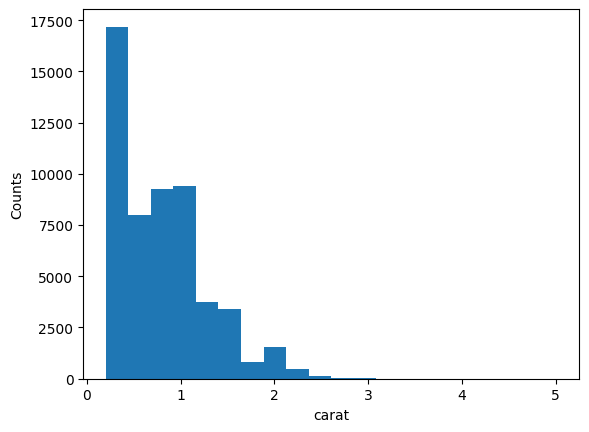

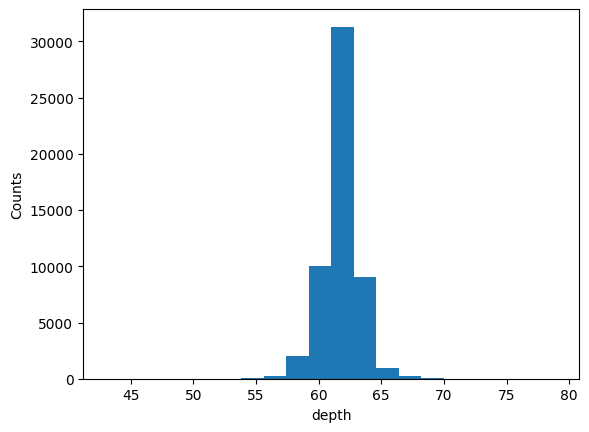

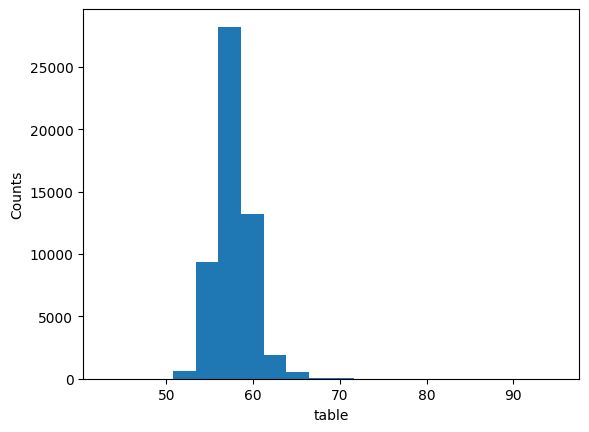

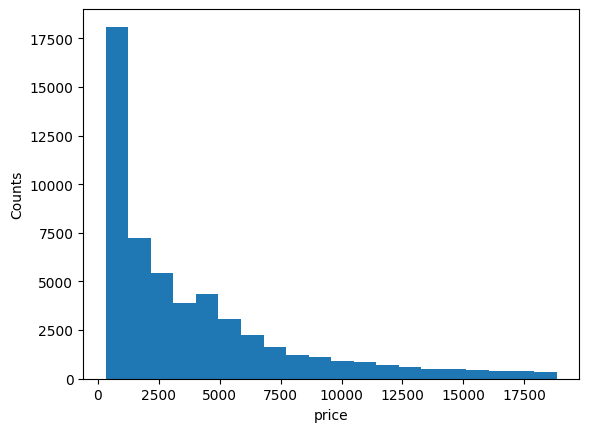

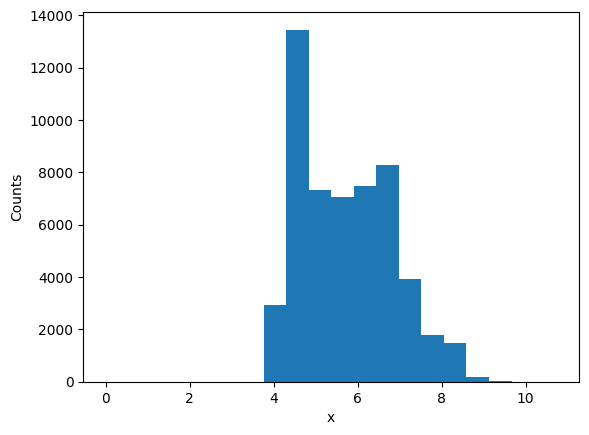

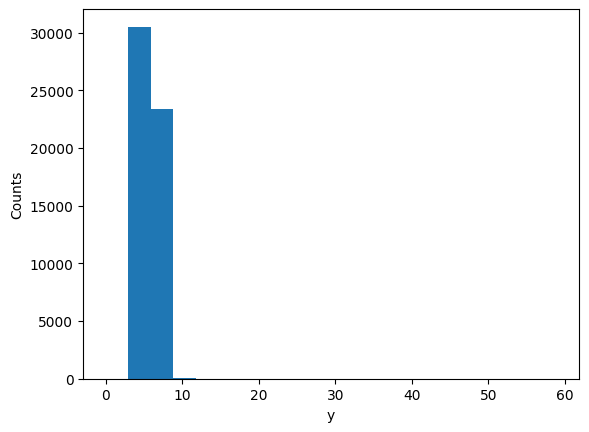

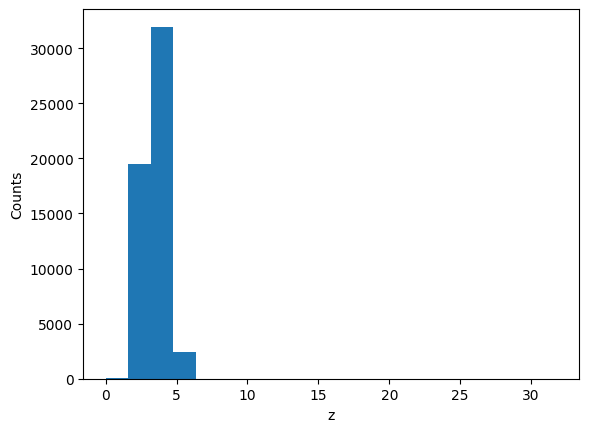

In [9]:
numerical_features = ['carat', 'depth', 'table', 'price', 'x', 'y', 'z']
for i in numerical_features:
    plt.hist(diamonds_original[i], bins=20)
    plt.xlabel(i)
    plt.ylabel('Counts')
    plt.show()

### Question 1.3
Construct and inspect the box plot of categorical features vs target variable. What do you find?
> Ans: There are totally three categorical features as the boxplots are shown below. For the `cut` feature, except that diamond with "Premium" cut tend to have slightly higher prices, we observed that the price distributions are similar given the the cut of the diamond. As for the `color` feature, we found that the price increases with the order of the character of the color code. Finally for the `clarity` feature, the distributions are mostly varied except two groups: 1. "IF" and "WS1", 2. "VS1" and "VS2".

#### There are 3 categorical features: cut, color and clarity. Each box plot is shown as follows. 

Text(0.5, 1.0, 'Box Plot for Cut vs. Price')

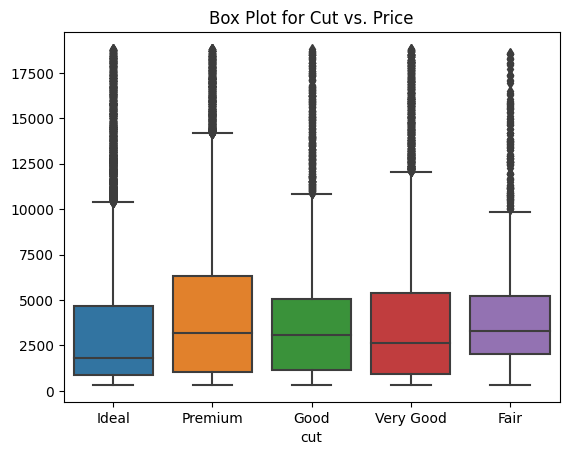

In [53]:
sns.boxplot(x=diamonds_original['cut'], y=diamonds_original['price'])
plt.title('Box Plot for Cut vs. Price')

Text(0.5, 1.0, 'Box Plot for Color vs. Price')

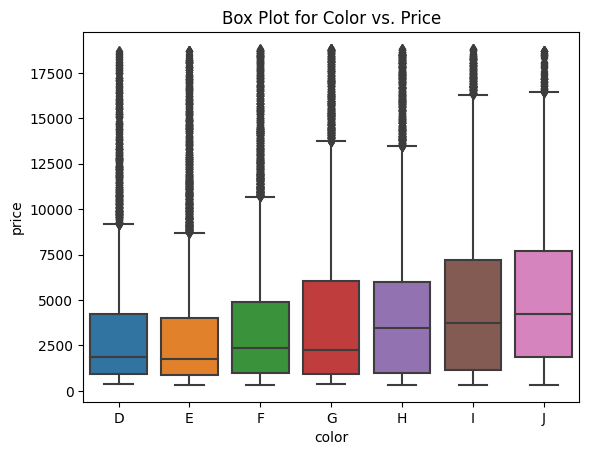

In [11]:
sns.boxplot(x=diamonds_original['color'], y=diamonds_original['price'], order=['D', 'E', 'F', 'G', 'H', 'I', 'J'])
plt.title('Box Plot for Color vs. Price')

Text(0.5, 1.0, 'Box Plot for Clarity vs. Price')

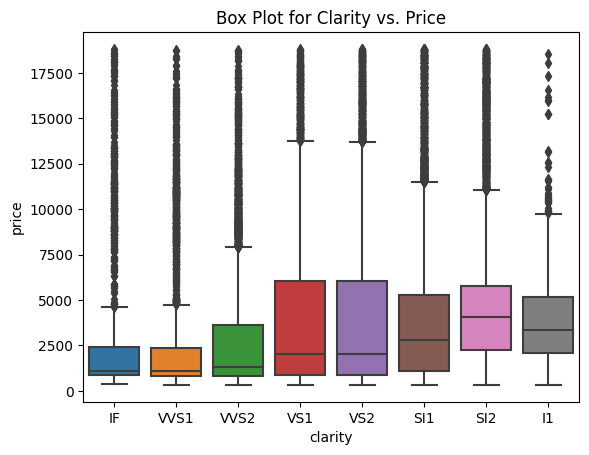

In [12]:
sns.boxplot(x=diamonds_original['clarity'], y=diamonds_original['price'], order=['IF', 'VVS1', 'VVS2', 'VS1', 'VS2', 'SI1', 'SI2', 'I1'])
plt.title('Box Plot for Clarity vs. Price')

### Question 1.4
For the Diamonds dataset, plot the counts by color, cut and clarity.

Text(0.5, 1.0, 'Counts for Each Color')

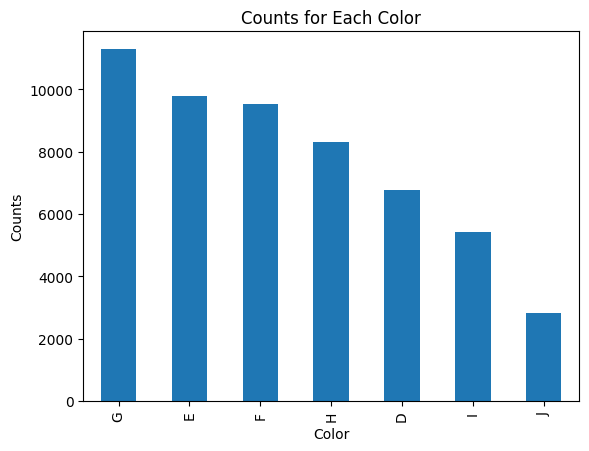

In [11]:
diamonds_original['color'].value_counts().plot(kind='bar')
plt.xlabel('Color')
plt.ylabel('Counts')
plt.title('Counts for Each Color')

Text(0.5, 1.0, 'Counts for Each Cut')

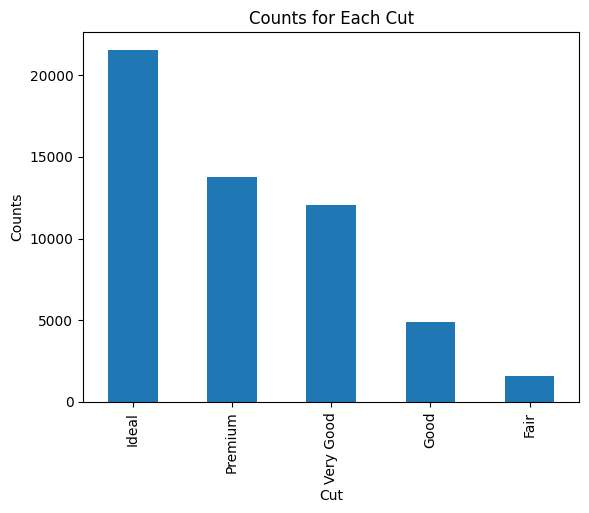

In [12]:
diamonds_original['cut'].value_counts().plot(kind='bar')
plt.xlabel('Cut')
plt.ylabel('Counts')
plt.title('Counts for Each Cut')

Text(0.5, 1.0, 'Counts for Each Clarity')

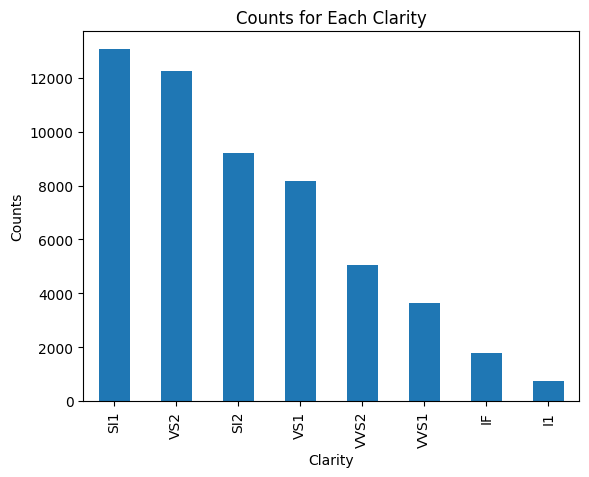

In [13]:
diamonds_original['clarity'].value_counts().plot(kind='bar')
plt.xlabel('Clarity')
plt.ylabel('Counts')
plt.title('Counts for Each Clarity')

### Question 2.1
Standardize feature columns and prepare them for training. 

From Piazza:
+ Split the dataset, and do fit_transform() on training set and transform() on test set.
+ Only standardize train set.
+ No, the standardization is not needed on the target variable. Yes, the RMSE will be larger.
https://piazza.com/class/lcjwqyyip6bid/post/220
https://piazza.com/class/lcjwqyyip6bid/post/223

In [114]:
Xdiamond = diamonds_data.loc[:, diamonds_data.columns != 'price']
Ydiamond = diamonds_data.price
X_train, X_test, y_train, y_test = train_test_split(Xdiamond, Ydiamond, test_size=0.1, random_state=77)
y_train = y_train.to_frame()

In [115]:
scaler = StandardScaler()
X_train_standard = scaler.fit_transform(X_train)
X_test_standard = scaler.transform(X_test)

### Question 2.2
Describe how Feature Selection qualitatively affects the performance of your models in terms of test RMSE. Is it true for all model types? Also list two features for either dataset that has the lowest MI w.r.t to the target.
> Ans: Mutual information tells us the dependency between two variables, while F score tells us whether an added new variable will improve a model. With these scores, we can avoid taking the less relevant features into consideration and prevent overfitting. From the plot below, we can see that for the three models, the decrase of RMSE halts at a certain point (k=6), since the most relevant features have already been selected.  <br>
For the diamonds dataset, the two features with the lowest MI w.r.t. price are: table (MI=0.036565) and depth (MI=0.031448).

In [116]:
RMSE_MIR_OLS, RMSE_F_OLS = [], []
RMSE_MIR_Lasso, RMSE_F_Lasso = [], []
RMSE_MIR_RR, RMSE_F_RR = [], []

for i in range(X_train_standard.shape[1]):
    print('k = ', i+1)
    Xdiamond_MIR = SelectKBest(score_func=mutual_info_regression, k=i+1).fit_transform(X_train_standard, y_train.values.ravel())
    Xdiamond_F = SelectKBest(score_func=f_regression, k=i+1).fit_transform(X_train_standard, y_train.values.ravel())
    
    print('Ordinary Least Squares')
    res1 = cross_validate(LinearRegression(), Xdiamond_MIR, y_train.values.ravel(), scoring=['neg_root_mean_squared_error'], cv=10, n_jobs=-1)
    RMSE_MIR_OLS.append(-(res1['test_neg_root_mean_squared_error'].mean()))
    res2 = cross_validate(LinearRegression(), Xdiamond_F, y_train.values.ravel(), scoring=['neg_root_mean_squared_error'], cv=10, n_jobs=-1)
    RMSE_F_OLS.append(-(res2['test_neg_root_mean_squared_error'].mean()))
    print('Average RMSE Error for Mutual Info Regression:', RMSE_MIR_OLS[-1])
    print('Average RMSE Error for F Regression:', RMSE_F_OLS[-1])
    
    print('Lasso')
    res1 = cross_validate(Lasso(), Xdiamond_MIR, y_train.values.ravel(), scoring=['neg_root_mean_squared_error'], cv=10, n_jobs=-1)
    RMSE_MIR_Lasso.append(-(res1['test_neg_root_mean_squared_error'].mean()))
    res2 = cross_validate(Lasso(), Xdiamond_F, y_train.values.ravel(), scoring=['neg_root_mean_squared_error'], cv=10, n_jobs=-1)
    RMSE_F_Lasso.append(-(res2['test_neg_root_mean_squared_error'].mean()))
    print('Average RMSE Error for Mutual Info Regression:', RMSE_MIR_Lasso[-1])
    print('Average RMSE Error for F Regression:', RMSE_F_Lasso[-1])
    
    print('Ridge Regression')
    res1 = cross_validate(Ridge(), Xdiamond_MIR, y_train.values.ravel(), scoring=['neg_root_mean_squared_error'], cv=10, n_jobs=-1)
    RMSE_MIR_RR.append(-(res1['test_neg_root_mean_squared_error'].mean()))
    res2 = cross_validate(Ridge(), Xdiamond_F, y_train.values.ravel(), scoring=['neg_root_mean_squared_error'], cv=10, n_jobs=-1)
    RMSE_F_RR.append(-(res2['test_neg_root_mean_squared_error'].mean()))
    print('Average RMSE Error for Mutual Info Regression:', RMSE_MIR_RR[-1])
    print('Average RMSE Error for F Regression:', RMSE_F_RR[-1])

k =  1
Ordinary Least Squares
Average RMSE Error for Mutual Info Regression: 1545.8955641911862
Average RMSE Error for F Regression: 1545.8955641911862
Lasso
Average RMSE Error for Mutual Info Regression: 1545.89599426108
Average RMSE Error for F Regression: 1545.89599426108
Ridge Regression
Average RMSE Error for Mutual Info Regression: 1545.8955726699164
Average RMSE Error for F Regression: 1545.8955726699164
k =  2
Ordinary Least Squares
Average RMSE Error for Mutual Info Regression: 1543.0423357852374
Average RMSE Error for F Regression: 1525.5664194317942
Lasso
Average RMSE Error for Mutual Info Regression: 1542.6964649319766
Average RMSE Error for F Regression: 1525.5947010354823
Ridge Regression
Average RMSE Error for Mutual Info Regression: 1543.0206431037318
Average RMSE Error for F Regression: 1525.5663725550007
k =  3
Ordinary Least Squares
Average RMSE Error for Mutual Info Regression: 1528.9467895431847
Average RMSE Error for F Regression: 1528.9467895431847
Lasso
Average 

Text(0, 0.5, 'Average RMSE')

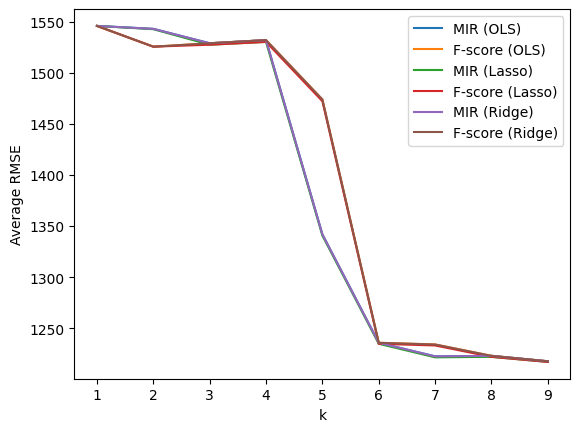

In [117]:
plt.plot(np.arange(1, 10), RMSE_MIR_OLS)
plt.plot(np.arange(1, 10), RMSE_F_OLS)
plt.plot(np.arange(1, 10), RMSE_MIR_Lasso)
plt.plot(np.arange(1, 10), RMSE_F_Lasso)
plt.plot(np.arange(1, 10), RMSE_MIR_RR)
plt.plot(np.arange(1, 10), RMSE_F_RR)
plt.legend(['MIR (OLS)','F-score (OLS)', 'MIR (Lasso)', 'F-score (Lasso)', 'MIR (Ridge)', 'F-score (Ridge)'])
plt.xlabel('k')
plt.ylabel('Average RMSE')

Choose k=6.

### 3.3 Evaluation
Perform 10-fold cross-validation and measure average RMSE errors for training and validation sets.

### Question 3
For random forest model, measure “Out-of-Bag Error” (OOB) as well. Explain what OOB error and R2 score means given this link. <br>
> *From Piazza 217 https://piazza.com/class/lcjwqyyip6bid/post/217 <br>
Q3: asks you to define it generally. <br>
Q7.4: asks you to evaluate the values with respect to the model trained in this section.*<br>
OOB error measures the prediction error of random forests, boosted decision trees etc. with bootstrap aggregating, which uses subsampling with replacement to create training samples. OOB error is the mean prediction error on each training sample. Since the calculation only uses trees that did not have the training sample in the bootstrap sample, it serves as a form of validation score for the ensemble. <br>
R2 is the ratio of the variance in the target variable that can be predicted by the features in the dataset. It includes all data in the training and validation set, not considering whether a sample is within a tree or not.

Reference: https://en.wikipedia.org/wiki/Out-of-bag_error#:~:text=Out%2Dof%2Dbag%20(OOB,the%20model%20to%20learn%20from.

#### What is the objective function? Train three models: (a) ordinary least squares (linear regression without regularization), (b) Lasso and (c) Ridge regression, and answer the following questions:

### Question 4.1
Explain how each regularization scheme affects the learned parameter set. 
>Ans: <br>
Lasso regression is linear regression with L1 regularization, which tends to shrink some parameter values to zero, and can result in sparse weights. It prevents overfitting and encourages feature selection. When the penalty term is weak, Lasso regression will be similar to the original linear regression, and will only make little changes to the learned parameter set compared to simply using linear regression. As the penalty term increases, more parameter values will become zero and result in a sparse parameter set. However, if the penalty term is too strong and turns most of the parameters to zero, we are no longer extracting useful features with the model. <br>
As for ridge regression, it is linear regression with L2 regularization, which also shrinks weights, but does not reduce any parameter to zero, since L2 assumes the priors on weights are sampled from a unit Gaussian distribution. It helps reduce collinearity effects of the features. The penalty term tends to produce diffuse weights, and stabilize the model by promoting participation of all the features.

### Question 4.2
Report your choice of the best regularization scheme along with the optimal penalty parameter and explain how you computed it. 
> To compute the optimal penalty parameter, we performed grid search with 10-fold cross validation, set λ in the range of [10^−5, 10^5], and applied on models 'Lasso' and 'Ridge' respectively. In addition, the differences between standardized and non-standardized datasets were also tested using X_train and X_train_standard. <br>
We chose the best regularization scheme to be: Lasso, F-score feature selection, alpha=1, which results in Test RMSE= 1234.7313838620905.

In [118]:
k = 6
Xdiamond_MIR = SelectKBest(score_func=mutual_info_regression, k=k).fit_transform(X_train, y_train.values.ravel())
Xdiamond_MIRS = SelectKBest(score_func=mutual_info_regression, k=k).fit_transform(X_train_standard, y_train.values.ravel())
Xdiamond_F = SelectKBest(score_func=f_regression, k=k).fit_transform(X_train, y_train.values.ravel())
Xdiamond_FS = SelectKBest(score_func=f_regression, k=k).fit_transform(X_train_standard, y_train.values.ravel())

#### Ordinary Least Squares

In [119]:
print('No Standardizaion')
res1 = cross_validate(LinearRegression(), Xdiamond_MIR, y_train, scoring=['neg_root_mean_squared_error'], cv=10, n_jobs=-1, return_train_score=True)
print('MIR: Train RMSE=', -(res1['train_neg_root_mean_squared_error'].mean()), ', Test RMSE=', -(res1['test_neg_root_mean_squared_error'].mean()))
res2 = cross_validate(LinearRegression(), Xdiamond_F, y_train, scoring=['neg_root_mean_squared_error'], cv=10, n_jobs=-1, return_train_score=True)
print('F-Score: Train RMSE=', -(res2['train_neg_root_mean_squared_error'].mean()), ', Test RMSE=',-(res2['test_neg_root_mean_squared_error'].mean()))
print('Standardizaion')
res1 = cross_validate(LinearRegression(), Xdiamond_MIRS, y_train, scoring=['neg_root_mean_squared_error'], cv=10, n_jobs=-1, return_train_score=True)
print('MIR: Train RMSE=', -(res1['train_neg_root_mean_squared_error'].mean()), ', Test RMSE=', -(res1['test_neg_root_mean_squared_error'].mean()))
res2 = cross_validate(LinearRegression(), Xdiamond_FS, y_train, scoring=['neg_root_mean_squared_error'], cv=10, n_jobs=-1, return_train_score=True)
print('F-Score: Train RMSE=', -(res2['train_neg_root_mean_squared_error'].mean()), ', Test RMSE=', -(res2['test_neg_root_mean_squared_error'].mean()))

No Standardizaion
MIR: Train RMSE= 1231.950403808161 , Test RMSE= 1235.8311097381393
F-Score: Train RMSE= 1231.950403808161 , Test RMSE= 1235.8311097381393
Standardizaion
MIR: Train RMSE= 1231.950403808161 , Test RMSE= 1235.8311097381393
F-Score: Train RMSE= 1231.950403808161 , Test RMSE= 1235.8311097381393


#### Lasso

In [127]:
def search_penalty(model, params):
    grid_mir = GridSearchCV(model, params, scoring='neg_root_mean_squared_error', n_jobs=-1, cv=10,  verbose=False, return_train_score=True).fit(Xdiamond_MIR, y_train)
    grid_mir_s = GridSearchCV(model, params, scoring='neg_root_mean_squared_error', n_jobs=-1, cv=10,  verbose=False, return_train_score=True).fit(Xdiamond_MIRS, y_train)
    grid_f = GridSearchCV(model, params, scoring='neg_root_mean_squared_error', n_jobs=-1, cv=10,  verbose=False, return_train_score=True).fit(Xdiamond_F, y_train)
    grid_f_s = GridSearchCV(model, params, scoring='neg_root_mean_squared_error', n_jobs=-1, cv=10,  verbose=False, return_train_score=True).fit(Xdiamond_FS, y_train)
    print('No standardization')
    print('MIR: Train RMSE=', -(max(grid_mir.cv_results_['mean_train_score'])), '; Test RMSE=', -(grid_mir.best_score_), '; alpha=', grid_mir.best_params_['model__alpha'])
    print('F-score: Train RMSE=', -(max(grid_f.cv_results_['mean_train_score'])), '; Test RMSE=', -(grid_f.best_score_), '; alpha=', grid_f.best_params_['model__alpha'])
    print('Standardiazation')
    print('MIR: Train RMSE=', -(max(grid_mir_s.cv_results_['mean_train_score'])), '; Test RMSE=', -(grid_mir_s.best_score_), '; alpha=', grid_mir_s.best_params_['model__alpha'])
    print('F-score: Train RMSE=', -(max(grid_f_s.cv_results_['mean_train_score'])), '; Test RMSE=', -(grid_f_s.best_score_), '; alpha=', grid_f_s.best_params_['model__alpha'])

In [128]:
pipe_lasso = Pipeline([('model', Lasso(random_state=77))])
param_grid = {'model__alpha': [10.0**x for x in np.arange(-5,5)]}
search_penalty(pipe_lasso, param_grid)

No standardization
MIR: Train RMSE= 1231.9504038081723 ; Test RMSE= 1234.7313838620905 ; alpha= 1.0
F-score: Train RMSE= 1231.9504038081723 ; Test RMSE= 1234.7313838620905 ; alpha= 1.0
Standardiazation
MIR: Train RMSE= 1231.9504038081677 ; Test RMSE= 1234.8266266013304 ; alpha= 1.0
F-score: Train RMSE= 1231.9504038081677 ; Test RMSE= 1234.8266266013304 ; alpha= 1.0


#### Ridge Regression

In [129]:
pipe_ridge = Pipeline([('model', Ridge(random_state=77))])
param_grid = {'model__alpha': [10.0**x for x in np.arange(-5,5)]}
search_penalty(pipe_ridge, param_grid)

No standardization
MIR: Train RMSE= 1231.950403808161 ; Test RMSE= 1235.6777883853667 ; alpha= 10.0
F-score: Train RMSE= 1231.950403808161 ; Test RMSE= 1235.6777883853667 ; alpha= 10.0
Standardiazation
MIR: Train RMSE= 1231.950403808161 ; Test RMSE= 1235.548907697946 ; alpha= 100.0
F-score: Train RMSE= 1231.950403808161 ; Test RMSE= 1235.548907697946 ; alpha= 100.0


### Question 4.3
Does feature standardization play a role in improving the model performance (in the cases with ridge regularization)? Justify your answer. 
> As we can see in the results above, there is no too much difference in the performance between model with standardization or not.

### Question 4.4
Some linear regression packages return p-values for different features. What is the meaning of these p-values and how can you infer the most significant features?
> p-value measures the probability of obtaining an observed result under the null hypothesis. The p-value for each feature assumes the null hypothesis "a feature has no correlation with the target variable" is true. The lower the p-value, the more likely we are to reject the null hypothesis. In the results below, we see some p-values close to 0. For the corresponding features, we have more confidence to say that this feature does not have no correlation with the target variable. The mose significant features are 'carat', 'color_numeric', and 'clarity_numeric'.

In [138]:
lr = OLS(y_train, X_train).fit()
print(lr.pvalues.sort_values())

carat               0.000000e+00
color_numeric       0.000000e+00
clarity_numeric     0.000000e+00
cut_numeric        4.101860e-148
depth              4.804137e-129
x                  3.657069e-116
table               1.690737e-10
z                   1.584959e-02
y                   1.880248e-02
dtype: float64


### Question 5.1
What are the most salient features? Why? 
> Below we performed grid search and figured that 'carat' and the diemnsions 'x', 'y', and 'z' are the most salient features. The top terms are composed of these features and their combinations. 

In [139]:
pipe_poly = Pipeline([('PR', PolynomialFeatures()), ('model', Ridge(random_state=77))])
param_poly = {'PR__degree': np.arange(2, 7), #Piazza 224: min degree = 2
                 'model__alpha': [10.0**x for x in np.arange(-5,5)]}
grid_poly = GridSearchCV(pipe_poly, param_grid=param_poly, cv=10, n_jobs=-1, verbose=False, scoring='neg_root_mean_squared_error', return_train_score=True).fit(Xdiamond_F, y_train)

/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=4.42444e-20): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=4.42429e-20): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.89447e-20): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=3.1219e-18): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overw

In [147]:
X_select = SelectKBest(score_func=f_regression, k=6) 
X_fit = X_select.fit_transform(X_train, y_train.values.ravel())
features = X_train.columns[X_select.get_support()]
params = grid_poly.best_estimator_.get_params()
coefs = params['model'].coef_
feature_names = params['PR'].get_feature_names_out(list(features))
idx = np.argsort(-abs(coefs))
salient_features = [feature_names[i] for i in idx]
print ('Top Salient Features:', salient_features[0][:10])

Top Salient Features: ['carat clarity_numeric' 'carat color_numeric' 'carat y' 'carat x'
 'carat z' 'x' 'y' 'x z' 'z' 'carat^2']


### Question 5.2
What degree of polynomial is best? How did you find the optimal degree? Whatdoes a very high-order polynomial imply about the fit on the training data? What about its performance on testing data? 
> Choose degree=5. We performed grid search on PolynomialFeatures, ranging the degrees from 2~6. We also plotted RMSE of the training and testing data over different degrees and saw that at degree=5, training error became desirably low but on the other hand, testing error is starting to rise. Therefore, we won't further increase the degree and get into the risk of overfitting.

In [148]:
res = pd.DataFrame(grid_poly.cv_results_)[['mean_train_score', 'mean_test_score', 'param_PR__degree', 'param_model__alpha']]
train, test, alpha = [], [], []
for i in np.arange(2, 7):
    train.append(-(res.loc[res['param_PR__degree'] == i]).max().mean_train_score)
    test.append(-(res.loc[res['param_PR__degree'] == i]).max().mean_test_score)

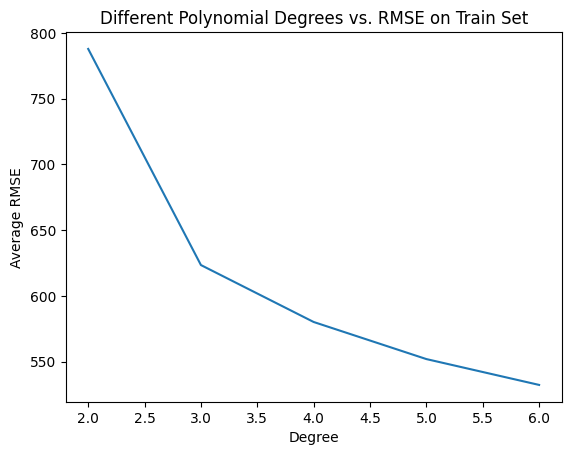

In [149]:
plt.plot(np.arange(2, 7), train)
plt.xlabel('Degree')
plt.ylabel('Average RMSE')
plt.title('Different Polynomial Degrees vs. RMSE on Train Set')
plt.show()

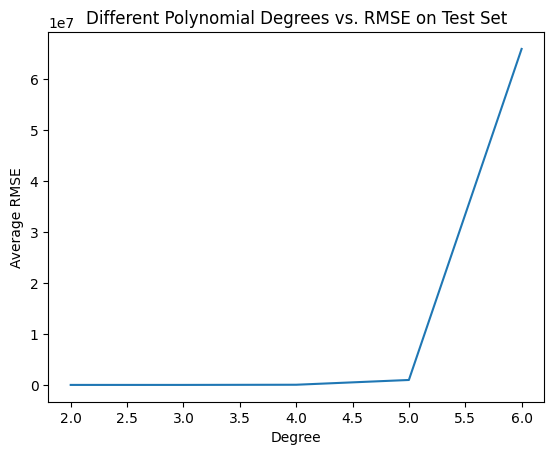

In [150]:
plt.plot(np.arange(2, 7), test)
plt.xlabel('Degree')
plt.ylabel('Average RMSE')
plt.title('Different Polynomial Degrees vs. RMSE on Test Set')
plt.show()

### Question 6.1
Adjust your network size (number of hidden neurons and depth), and weight decay as regularization. Find a good hyper-parameter set systematically (no more than 20 experiments in total). 
<br> (Side note:<br> 
+ Piazza posts concerning "weight decay" #248, #258 https://piazza.com/class/lcjwqyyip6bid/post/258 don't really answer the question. Here I'm assuming weight decay means beta_1 & 2 and didn't set anything additionally. https://scikit-learn.org/stable/modules/generated/sklearn.neural_network.MLPRegressor.html 
+ "no more than 20 experiments" I'm assuming it refers to network sizes.)
> Ans: We tested network sizes of depths 1~3, and each layer may contain 10, 20, 30 neurons respectively. Along with different activation functions, 'logistic', 'tanh', 'relu', and alphas from np.logspace(-1, 1, 5), we used GridSearchCV to search for the best parameter combinations. The results showed that the best combination is {network size: (30, 30, 30), activation function: 'relu', alpha: 3.1622776601683795}, with train RMSE: 602.1248387911928 and test RMSE: 614.2593043390436.

In [151]:
neurons = [10, 20, 30]
combinations = []
for i in range(len(neurons)+1):
    items = list(itertools.combinations_with_replacement(neurons, i))
    combinations += items
combinations = combinations[1:]

In [176]:
print('All network structures:', combinations)

All network structures: [(10,), (20,), (30,), (10, 10), (10, 20), (10, 30), (20, 20), (20, 30), (30, 30), (10, 10, 10), (10, 10, 20), (10, 10, 30), (10, 20, 20), (10, 20, 30), (10, 30, 30), (20, 20, 20), (20, 20, 30), (20, 30, 30), (30, 30, 30)]


In [152]:
pipe_nn = Pipeline([('model', MLPRegressor(random_state=77, max_iter=1000))]) #default solver='adam', beta_1=0.9, beta_2=0.999                        
param_nn = {'model__hidden_layer_sizes': combinations,
            'model__activation': ['logistic', 'tanh', 'relu'],
            'model__alpha': np.logspace(-1, 1, 5)}
grid_nn = GridSearchCV(pipe_nn, param_grid=param_nn, cv=10, n_jobs=-1, verbose=False, scoring='neg_root_mean_squared_error', return_train_score=True).fit(Xdiamond_F, y_train)

/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/skle

In [154]:
res_nn = pd.DataFrame(grid_nn.cv_results_)[['mean_train_score', 'mean_test_score', 'param_model__alpha', 'param_model__activation', 'param_model__hidden_layer_sizes']]
print('Best parameters:', grid_nn.best_params_, 'Train RMSE:', -(max(res_nn.mean_train_score)), ', Test RMSE:', -(grid_nn.best_score_))

Best parameters: {'model__activation': 'relu', 'model__alpha': 3.1622776601683795, 'model__hidden_layer_sizes': (30, 30, 30)} Train RMSE: 602.1248387911928 , Test RMSE: 614.2593043390436


### Question 6.2
How does the performance generally compare with linear regression? Why? 
> Ans:<br>
The table below shows the comparison between the best results of linear regression (with L1 and L2 regression) and neural network, and we can see that neural network performs significantly better, reaching training and testing RMSE at around 600, which is half of that produced by linear regression. This is because compared to linear regression, neural networks capture the non-linearity relationship between the input and the target variable. In addition, with the hidden layers and neurons, neural networks are able handle high-dimensional data and capture only the relevant features.

|Method    |Linear Regression|Lasso|Ridge|Neural Network|
|:--------:|:---------------:|:---:|:---:|:------------:|
|Train RMSE|1231.95|1231.95|1231.95|602.12|
|Test RMSE |1235.83|1234.83|1235.55|614.26|

### Question 6.3
What activation function did you use for the output and why? You may use none.
> Ans: Of all the combinations, the network with 'relu' activation gives the best results. ReLU is a linear function when the input is >0, and is often used for regression or classification problems, especially when the target variable is non-negative. Our task is a regression problem aiming to predict the price, where ReLU perfectly suits. In addition, ReLU has the advantages of computational efficiency and is less likely to suffer from vanishing gradients.

### Question 6.4
What is the risk of increasing the depth of the network too far?
> Ans:
> 1. Vanishing or exploding gradients: Since a great part of neural networks relies on back-propagation, we should consider that as we deepen a network, the gradients will become exponentially small or large when we reach back to the earlier layers, and may lead to convergence to a sub-optimal point.
> 2. Overfitting: Deeper neural networks will inevitably be more complex and have more trainable parameters, which might overfit the training data and could not generalize well on the test data.
> 3. Memory and time intensive: A deeper network takes more time to train and also needs more memory to store the variables.
> 4. Interpretability: Large amount of parameters will lead to complex relationships between features and target variables, and can make it hard to interpret intuitively.

### Question 7.1 
Explain how these hyper-parameters affect the overall performance. Describe if and how each hyper-parameter results in a regularization effect during training.
> Ans:
> 1. Maximum number of features: From our results, we see that the training error decreased steadily as the the number of features increased, but for the testing error, the decrease halted at a certain point. Since increasing the number of feature improves model capacity for each tree, but also increrases the correlation between different trees and will eventually lead to overfitting. Only selecting the important features can help with better generalization and prevent overfitting.
> 2. Number of trees: Since each tree results from a set of randomized individual bootstrap subsample, the growth of different trees does not affect one another. Increasing the number of trees itself generally does not cause overfitting, but can act as a regularization effect and lead to better performance. However, it may increases computational and training complexity.
> 3. Depth of each tree: As shown in the plot below, we see that the error rate decreased significantly for the training dataset as we increased the tree depth. However, for the testing dataset, after reaching a minimal error at depth=10, the error rate starts to once again increase slightly. Since increasing the tree depth also increses the number of splits, it will eventually cause overfitting by considering too many complex patterns. A shallower tree may have a regularization effect by promoting generalization and preventing overfitting.

In [155]:
pipe_rf = Pipeline([('model', RandomForestRegressor(random_state=77, oob_score=True))])
param_rf = {'model__max_features': np.arange(1, 5),
            'model__n_estimators': np.arange(10, 210, 10),
            'model__max_depth': np.arange(1, 21)}
grid_rf = GridSearchCV(pipe_rf, param_grid=param_rf, cv=10, n_jobs=-1, verbose=False, scoring='neg_root_mean_squared_error', return_train_score=True).fit(Xdiamond_F, y_train)
res_rf = pd.DataFrame(grid_rf.cv_results_)[['mean_train_score', 'mean_test_score', 'param_model__max_features','param_model__n_estimators','param_model__max_depth']]
print('Best parameters:', grid_rf.best_params_, 'Train RMSE:', -(max(res_rf.mean_train_score)), ', Test RMSE:', -(grid_rf.best_score_))

/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/pipeline.py:406: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self._final_estimator.fit(Xt, y, **fit_params_last_step)
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:584: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable OOB estimates.
  warn(
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/pipeline.py:406: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self._final_estimator.fit(Xt, y, **fit_params_last_step)
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/pipeline.py:406: DataConversionWarning: A column-vector y was passed when a 1

Best parameters: {'model__max_depth': 14, 'model__max_features': 4, 'model__n_estimators': 130} Train RMSE: 220.10684767084336 , Test RMSE: 548.3859582686234


In [161]:
max_features = np.arange(1, 5).reshape(4)
n_estimators = np.arange(10, 210, 10).reshape(20)
max_depth = np.arange(1, 21).reshape(20)

def params_rmse(param1, n1, param2, n2):
    train = list(-((res_rf[(res_rf[param1] == n1) & (res_rf[param2] == n2)]).mean_train_score))
    test = list(-((res_rf[(res_rf[param1] == n1) & (res_rf[param2] == n2)]).mean_test_score))
    if (param1 != 'param_model__n_estimators') and (param2 != 'param_model__n_estimators'):
        x_axis, x_param = n_estimators, 'Number of Trees'
    elif (param1 != 'param_model__max_depth') and (param2 != 'param_model__max_depth'):
        x_axis, x_param = max_depth, 'Depth of Each Tree'
    else: x_axis, x_param = max_features, 'Maximum Number of Features'   
    plt.plot(x_axis, train)
    plt.plot(x_axis, test)
    plt.xlabel(x_param)
    plt.ylabel('Average RMSE')
    plt.title('Average RMSE vs. Different %s' %x_param)
    plt.legend(['Train', 'Test'])
    plt.show()

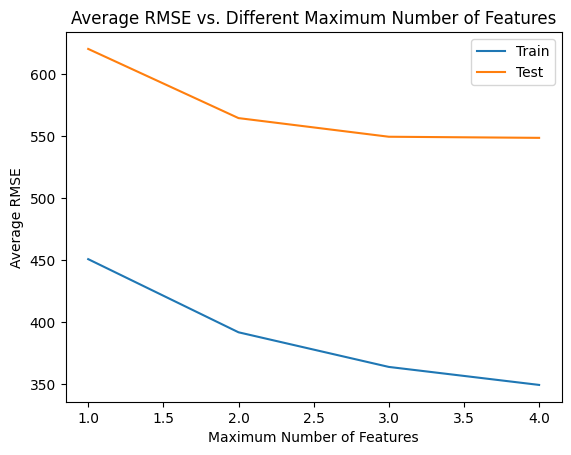

In [163]:
params_rmse('param_model__max_depth' , 14, 'param_model__n_estimators', 130)

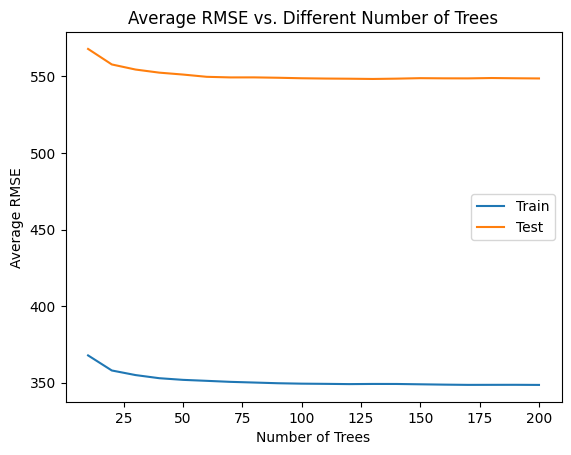

In [162]:
params_rmse('param_model__max_depth', 14, 'param_model__max_features', 4)

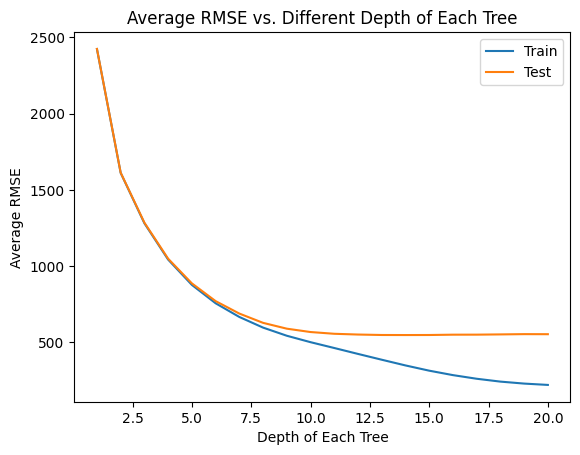

In [164]:
params_rmse('param_model__max_features' , 4, 'param_model__n_estimators', 130)

### Question 7.2
How do random forests create a highly non-linear decision boundary despite the fact that all we do at each layer is apply a threshold on a feature?

> Ans: A random forest is an ensemble of individual decision trees. While for each layer we only simply apply a threshold on a feature, by combining different trees with different splits, features, and thresholds, we can get more sophisticated decision boundaries. Random forests combine multiple uncorrelated models and outperform each individual model because it captures the non-linearity relationships between features that may not show from a single decision tree.

### Question 7.3
Randomly pick a tree in your random forest model (with maximum depth of 4) and plot its structure. Which feature is selected for branching at the root node? What can you infer about the importance of this feature as opposed to others? Do the important features correspond to what you got in part 3.3.1? 
>Ans: The feature selected for branching at the root node is 'carat.' This makes sense because carat measures the weights for diamonds. According to GIA, larger diamonds are rarer and more desirable, therefore more pricey. Moreover, color, clarity, and cut are the three other important factors that affect the diamond price given that the carats are the same. <br>
Following 'carat,' we have 'y' and 'clarity_numeric' selected for branching. From 3.3.1, the top 5 salient features are carat, y, x, z, and clarity_numeric. While 'x' and 'z' are not selected for branching, they are a means of measuring diamond dimension as y is, and we assume they have similar effects when it comes to price prediction. Overall, the branching features are in line with the salient features selected previously.<br>
Reference: https://4cs.gia.edu/en-us/diamond-carat-weight/

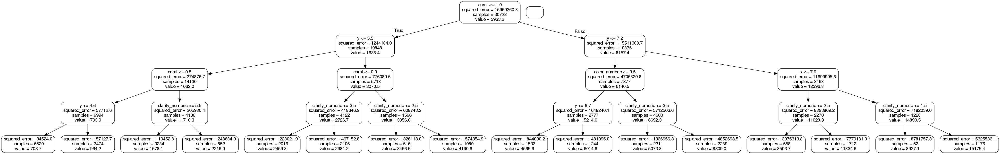

In [166]:
rf = RandomForestRegressor(random_state=77, max_depth=4, max_features=4, n_estimators=130).fit(Xdiamond_F, y_train.values.ravel())
tree = rf.estimators_[1]
export_graphviz(tree, out_file = 'tree.dot', feature_names=features, rounded=True, precision=1)
(graph, ) = pydot.graph_from_dot_file('tree.dot')
Image(graph.create_png())

### Question 7.4
Measure “Out-of-Bag Error” (OOB). Explain what OOB error and R2 score means.
>Ans: The measured OOB score is 0.98. OOB score can be used if there is not enough data to split for train and validation sets. It resembles R2 score, but is calculated using only the training data by subsampling different portions for each calculation. The R2 score tells how successfully a model accounts for the intrinsic variation, and runs the trained model on the validation data. Both scores can be used to predict the generalizability of a model.

In [168]:
print('OOB error:', RandomForestRegressor(random_state=77, max_depth=19, max_features=2, n_estimators=200, oob_score=True).fit(Xdiamond_F, y_train.values.ravel()).oob_score_)

OOB error: 0.9800773920038945


### Question 8.1
Read the documentation of LightGBM OR CatBoost and determine the important hyperparameters along with a search space for the tuning of these parameters (keep the search space small). 

#### LightGBM
> The list of hyperparameters we consider important are as follows:
> 1. 'boosting_type': Selects the type of method for constructing a decision tree. Our search space includes: ‘gbdt’, traditional Gradient Boosting Decision Tree; ‘dart’, ‘rf’, Random Forest, and 'dart', Dropouts meet Multiple Additive Regression Trees.
> 2. 'num_tree': Number of boosting iterations. Our search space is: np.arange(10, 3000, 100)
> 3. 'num_leaves': Maximum tree leaves for base learners. Our search space is: np.arange(20, 1000, 20)
> 4. 'max_depth': Maximum tree depth for base learners. Our search space is: np.arange(1, 50, 5)
> 5. 'lambda_l1': Strength of L1 regularization. Our search space is: [10.0**x for x in np.arange(-4, 3)]
> 6. 'lambda_l2': Strength of L2 regularization. Our search space is: [10.0**x for x in np.arange(-4, 3)]
> 7. 'bagging': The fraction of the sampling, constrained to 0 < bagging <= 1.0. Our search space is: np.arange(0.1, 1, 0.1)
> 8. 'bagging_freq': The frequency for bagging. Our search space is: np.arange(0, 50, 5)
> 9. 'min_split_gain': The minimal gain to perform split, and can be used to speed up training. Our search space is: [10.0**x for x in np.arange(-4, 0)]<br> 
Reference: https://lightgbm.readthedocs.io/en/latest/Parameters.html, https://lightgbm.readthedocs.io/en/latest/pythonapi/lightgbm.LGBMRegressor.html

### Question 8.2
Apply Bayesian optimization using skopt.BayesSearchCV from scikit-optmize to find the ideal hyperparameter combination in your search space. Report the best hyperparameter set found and the corresponding RMSE. 
> Ans: The best parameters are:

|Parameter|Value|
|:-------:|:---:|
|'bagging'|0.6|
|'bagging_freq'|10|
|'boosting_type'|'dart'|
|'lambda_l1'|1.0|
|'lambda_l2'|10.0|
|'max_depth'|41|
|'min_split_gain'|0.001|
|'num_leaves'|460|
|'num_tree'|510|

>rendering train RMSE: 195.34263528513097 and test RMSE: 546.5188445165489.

In [170]:
bayes_lgbm = BayesSearchCV(lgb.LGBMRegressor(random_state=77, verbose=1, n_jobs=-1),
                    {'boosting_type': ['gbdt', 'rf', 'dart'],
                     'num_tree': np.arange(10, 3000, 100),
                     'num_leaves': np.arange(20, 1000, 20),
                     'max_depth': np.arange(1, 50, 5),
                     'lambda_l1': [10.0**x for x in np.arange(-4, 3)],
                     'lambda_l2': [10.0**x for x in np.arange(-4, 3)],
                     'bagging': np.arange(0.1, 1, 0.1),
                     'bagging_freq': np.arange(0, 50, 5),
                     'min_split_gain': [10.0**x for x in np.arange(-4, 0)]},
                    n_iter=20, scoring='neg_root_mean_squared_error', n_jobs=-1, cv=10, verbose=False, random_state=77, return_train_score=True)
lgbm_fit = bayes_lgbm.fit(Xdiamond_F, y_train)

/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_tree` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_tree` in params. Will use it instead of argument
  _log_warning(f"F

[LightGBM] [Warning] bagging_fraction is set with subsample=1.0, will be overridden by bagging=0.5. Current value: bagging_fraction=0.5
[LightGBM] [Warning] num_iterations is set=2210, num_tree=2210 will be ignored. Current value: num_iterations=2210
[LightGBM] [Warning] lambda_l1 is set=10.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=10.0
[LightGBM] [Warning] lambda_l2 is set=0.01, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01
[LightGBM] [Warning] bagging_freq is set=30, subsample_freq=0 will be ignored. Current value: bagging_freq=30
[LightGBM] [Warning] bagging_fraction is set with subsample=1.0, will be overridden by bagging=0.5. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l1 is set=10.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=10.0
[LightGBM] [Warning] lambda_l2 is set=0.01, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01
[LightGBM] [Warning] bagging_freq is set=30, subsample_freq=0 will be ignored. Cu

/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_tree` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_tree` in params. Will use it instead of argument
  _log_warning(f"F

[LightGBM] [Warning] bagging_fraction is set with subsample=1.0, will be overridden by bagging=0.2. Current value: bagging_fraction=0.2
[LightGBM] [Warning] num_iterations is set=2210, num_tree=2210 will be ignored. Current value: num_iterations=2210
[LightGBM] [Warning] lambda_l1 is set=1.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0
[LightGBM] [Warning] lambda_l2 is set=10.0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.0
[LightGBM] [Warning] bagging_freq is set=20, subsample_freq=0 will be ignored. Current value: bagging_freq=20
[LightGBM] [Warning] bagging_fraction is set with subsample=1.0, will be overridden by bagging=0.2. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l1 is set=1.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0
[LightGBM] [Warning] lambda_l2 is set=10.0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.0
[LightGBM] [Warning] bagging_freq is set=20, subsample_freq=0 will be ignored. Curren

/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_tree` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_tree` in params. Will use it instead of argument
  _log_warning(f"F

[LightGBM] [Warning] bagging_fraction is set with subsample=1.0, will be overridden by bagging=0.6. Current value: bagging_fraction=0.6
[LightGBM] [Warning] num_iterations is set=1810, num_tree=1810 will be ignored. Current value: num_iterations=1810
[LightGBM] [Warning] lambda_l1 is set=0.001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001
[LightGBM] [Warning] lambda_l2 is set=0.01, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01
[LightGBM] [Warning] bagging_freq is set=40, subsample_freq=0 will be ignored. Current value: bagging_freq=40
[LightGBM] [Warning] bagging_fraction is set with subsample=1.0, will be overridden by bagging=0.6. Current value: bagging_fraction=0.6
[LightGBM] [Warning] lambda_l1 is set=0.001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001
[LightGBM] [Warning] lambda_l2 is set=0.01, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01
[LightGBM] [Warning] bagging_freq is set=40, subsample_freq=0 will be ignored

/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_tree` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_tree` in params. Will use it instead of argument
  _log_warning(f"F


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_tree` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_tree` in params. Will use it instead of argument
  _log_warning(f"F


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_tree` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_tree` in params. Will use it instead of argument
  _log_warning(f"F


[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 43691, number of used features: 6
[LightGBM] [Info] Start training from score 3935.709986
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_tree` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_tree` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_tree` in params. Will use it instead of argument
  _log_warning(f"F


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_tree` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_tree` in params. Will use it instead of argument
  _log_warning(f"F

[LightGBM] [Warning] bagging_fraction is set with subsample=1.0, will be overridden by bagging=0.6. Current value: bagging_fraction=0.6
[LightGBM] [Warning] num_iterations is set=2610, num_tree=2610 will be ignored. Current value: num_iterations=2610
[LightGBM] [Warning] lambda_l1 is set=10.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=10.0
[LightGBM] [Warning] lambda_l2 is set=10.0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.0
[LightGBM] [Warning] bagging_freq is set=30, subsample_freq=0 will be ignored. Current value: bagging_freq=30
[LightGBM] [Warning] bagging_fraction is set with subsample=1.0, will be overridden by bagging=0.6. Current value: bagging_fraction=0.6
[LightGBM] [Warning] lambda_l1 is set=10.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=10.0
[LightGBM] [Warning] lambda_l2 is set=10.0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.0
[LightGBM] [Warning] bagging_freq is set=30, subsample_freq=0 will be ignored. Cu

/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_tree` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_tree` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_tree` in params. Will use it instead of argument
  _log_warning(f"F


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_tree` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected.

[LightGBM] [Warning] bagging_fraction is set with subsample=1.0, will be overridden by bagging=0.6. Current value: bagging_fraction=0.6
[LightGBM] [Warning] num_iterations is set=510, num_tree=510 will be ignored. Current value: num_iterations=510
[LightGBM] [Warning] lambda_l1 is set=0.001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001
[LightGBM] [Warning] lambda_l2 is set=100.0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100.0
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] bagging_fraction is set with subsample=1.0, will be overridden by bagging=0.6. Current value: bagging_fraction=0.6
[LightGBM] [Warning] lambda_l1 is set=0.001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001
[LightGBM] [Warning] lambda_l2 is set=100.0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100.0
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. 

/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_tree` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_tree` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_tree` in params. Will use it instead of argument
  _log_warning(f"F


[LightGBM] [Warning] bagging_freq is set=40, subsample_freq=0 will be ignored. Current value: bagging_freq=40
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1021
[LightGBM] [Info] Number of data points in the train set: 43691, number of used features: 6
[LightGBM] [Info] Start training from score 3919.456982
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warni

/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_tree` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_tree` in params. Will use it instead of argument
  _log_warning(f"F

[LightGBM] [Warning] bagging_fraction is set with subsample=1.0, will be overridden by bagging=0.1. Current value: bagging_fraction=0.1
[LightGBM] [Warning] num_iterations is set=110, num_tree=110 will be ignored. Current value: num_iterations=110
[LightGBM] [Warning] lambda_l1 is set=0.1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1
[LightGBM] [Warning] lambda_l2 is set=1.0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0
[LightGBM] [Warning] bagging_freq is set=40, subsample_freq=0 will be ignored. Current value: bagging_freq=40
[LightGBM] [Warning] bagging_fraction is set with subsample=1.0, will be overridden by bagging=0.1. Current value: bagging_fraction=0.1
[LightGBM] [Warning] lambda_l1 is set=0.1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1
[LightGBM] [Warning] lambda_l2 is set=1.0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0
[LightGBM] [Warning] bagging_freq is set=40, subsample_freq=0 will be ignored. Current value

/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_tree` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_tree` in params. Will use it instead of argument
  _log_warning(f"F


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_tree` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_tree` in params. Will use it instead of argument
  _log_warning(f"F


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_tree` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_tree` in params. Will use it instead of argument
  _log_warning(f"F


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_tree` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/ray080186/.pyenv/versions/3.9.0/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_tree` in params. Will use it instead of argument
  _log_warning(f"F


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

In [171]:
print('Best parameters:', bayes_lgbm.best_params_, 'Train RMSE:', -(max(bayes_lgbm.cv_results_['mean_train_score'])), '; Test RMSE:', -(bayes_lgbm.best_score_))

Best parameters: OrderedDict([('bagging', 0.6), ('bagging_freq', 10), ('boosting_type', 'dart'), ('lambda_l1', 1.0), ('lambda_l2', 10.0), ('max_depth', 41), ('min_split_gain', 0.001), ('num_leaves', 460), ('num_tree', 510)]) Train RMSE: 195.34263528513097 ; Test RMSE: 546.5188445165489


### Question 8.3
Qualitatively interpret the effect of the hyperparameters using the Bayesian optimization results: Which of them helps with performance? Which helps with regularization (shrinks the generalization gap)? Which affects the fitting efficiency?
> Ans: We plotted the error rate trend for each hyperparameter, and interpreted the results accordingly:
> 1. Boosting Type: gbdt is an ensemble model of decision trees, and is widely used because of its efficiency and stability. Each decision tree learns according to its previous tree. However, trees added at later iterations tend to make a negligible contribution towards the remaining instances. Therefore, 'dart' introduces dropout to make it more difficult for the trees at later iterations to specialize on only a few samples and hence improves the performance. While we expect 'dart' to perform better, our results did not align with the expectation. We assume it is because dart has other adjustable hyperparameters (e.g. probability of skipping dropout), which can make the results more unpredictable.
> 2. Number of Trees: As we increase the number of trees, we see the trend of decreasing RMSE. Since more trees do not cause overfitting, which is similar to random forests as mentioned above, increasing the number of trees may help stabilize the model and improve its performance.
> 3. Number of Leaves: Increasing the number of leaves helps decrease the error rate by taking more features into consideration. The hyperparameter acts as a regularizer and helps improve performance, but we have to avoid adding too many leaves to prevent the problem of overfitting.
> 4. Depth of Tree: Increasing the tree depth generally helps decrease the error rate. It acts as a regularizer and helps with performance as well. However, if the depth becomes too large, the model will also consider the effect of noise and cause overfitting. In conclusion, increasing tree depth decreases bias but increases variance.
> 5. L1: We can observe that both training and testing RMSE dropped significantly at the very beginning, but rose back up as we further increase the regularization strength. L1 aims to increase model generalization, but if the value is too high, the regularization term will dominate the original model when calculating the errors and become too noisy. 
> 6. L2: Similar to L1 regularization, small regularization strength helps reduce RMSE, but we won't want the term to be too high to dominate the original model. We can also observe that L1 regularization is more robust than L2 as it may zero out some weights.
> 7. Bagging: As the subsampling ratio increases, the performance also imporves. Bagging helps reduce the variance of ensembling and has a regularizing effect when the subsampling ratio is small, even though very small values may cause models to perform poorly. On the other hand, large bagging ratio is similar to no bagging effect, which may cause the model to perform well on the training set but generalizes poorly on the testing set.
> 8. Bagging Frequency: As the frequency increases, there is a chance that RMSE rebounds. Since bagging acts as a regularizer, we can expect that the more frequent we perform bagging, the more likely we are to drop some important samples from the dataset and imperil the overall performance.
> 9. Minimal Split Gain: The plot indicates that as min_split_gain increases, there is minimal effect on decreasing RMSE. This hyperparameter mainly serves as an accelerator for speeding up fitting efficiency. <br>
Reference: https://neptune.ai/blog/lightgbm-parameters-guide

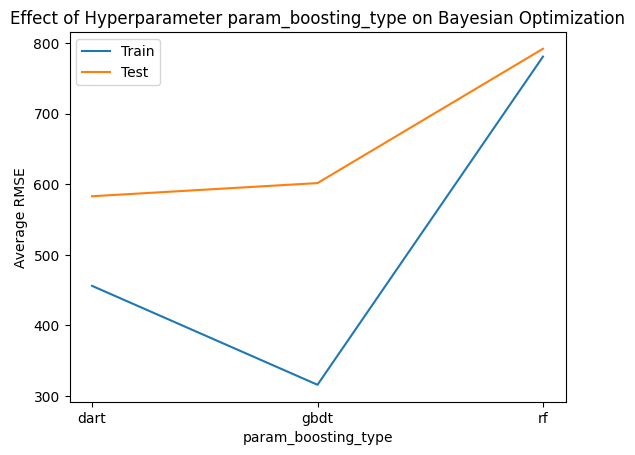

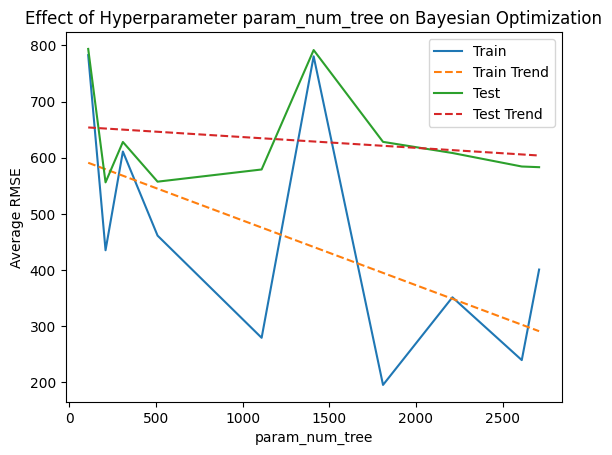

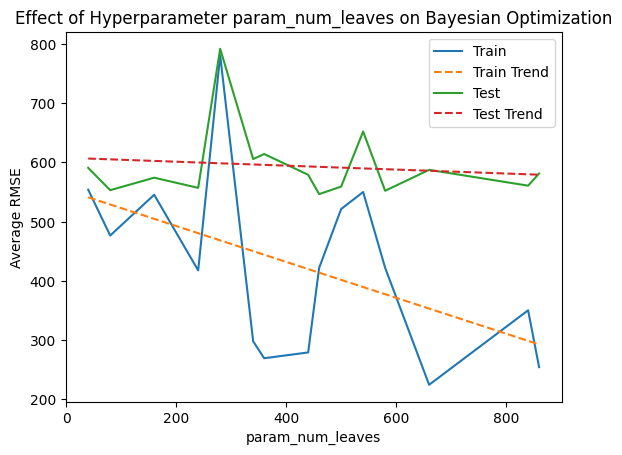

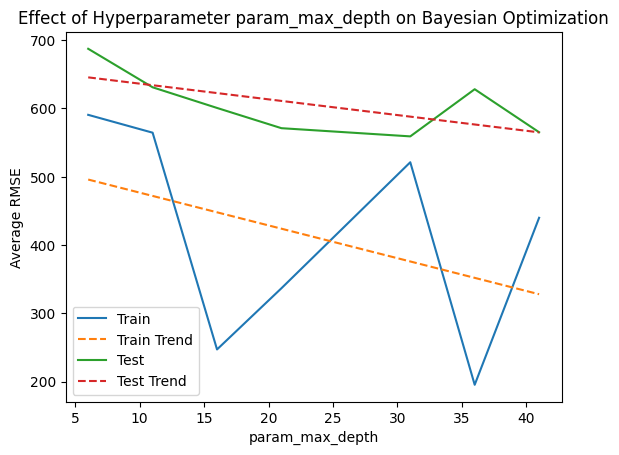

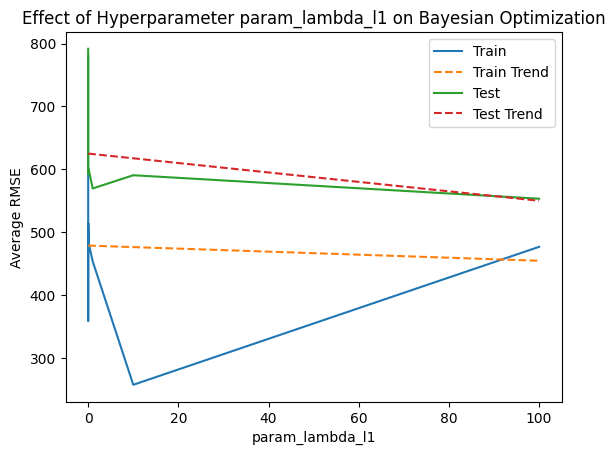

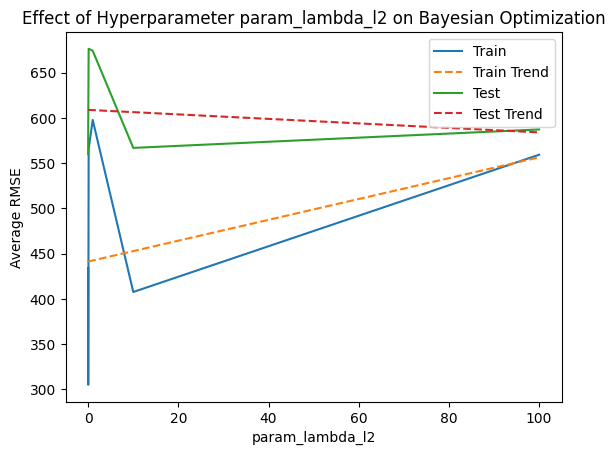

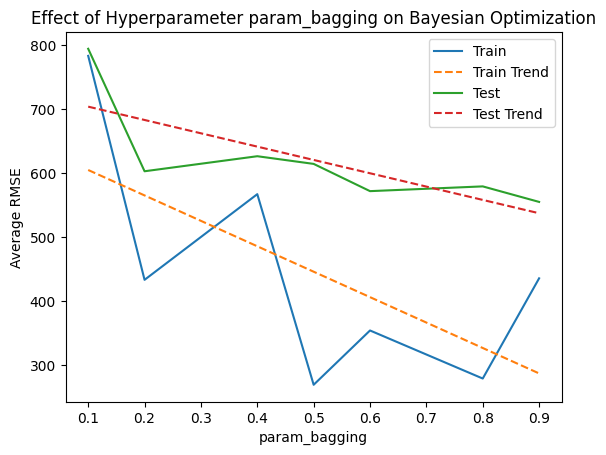

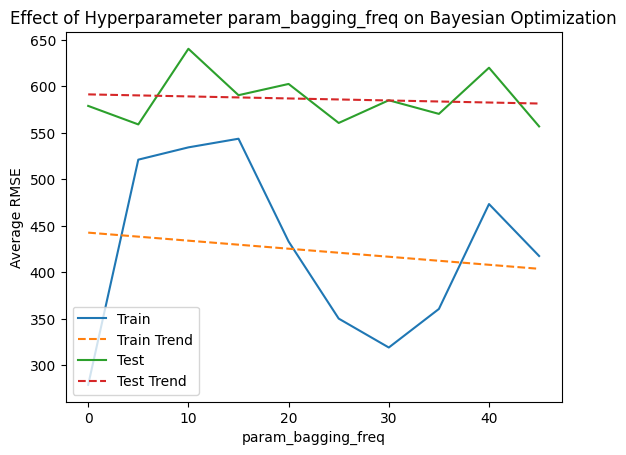

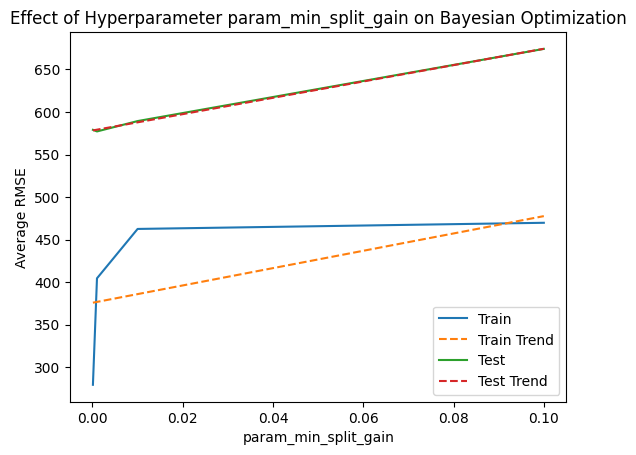

In [173]:
param_lgbm = ['param_boosting_type', 'param_num_tree', 'param_num_leaves', 'param_max_depth', 'param_lambda_l1',
              'param_lambda_l2', 'param_bagging', 'param_bagging_freq', 'param_min_split_gain'] 
for i in param_lgbm:
    param_set = sorted(list(set(bayes_lgbm.cv_results_[i])))  
    param_train, param_test = [], []
    for j in param_set:
        param_train.append(-(np.mean([bayes_lgbm.cv_results_['mean_train_score'][k] for k in [n for n, x in enumerate(bayes_lgbm.cv_results_[i]) if x == j]]))) 
        param_test.append(-(np.mean([bayes_lgbm.cv_results_['mean_test_score'][k] for k in [n for n, x in enumerate(bayes_lgbm.cv_results_[i]) if x == j]])))
    plt.plot(param_set, param_train, label='Train')
    if(type(param_set[0]).__name__ != 'str'):
        plt.plot(param_set, np.poly1d(np.polyfit(param_set, param_train, 1))(param_set), '--', label='Train Trend')
    plt.plot(param_set, param_test, label='Test')
    if(type(param_set[0]).__name__ != 'str'):
        plt.plot(param_set, np.poly1d(np.polyfit(param_set, param_test, 1))(param_set), '--', label='Test Trend')
    plt.xlabel(i)
    plt.ylabel('Average RMSE')
    plt.title('Effect of Hyperparameter %s on Bayesian Optimization' %i)
    plt.legend()
    plt.show()